<a href="https://colab.research.google.com/github/eueu29/AIFFEL_quest/blob/main/Exploration_quest/Quest03/quest3_semantic_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 주현님 trial

In [ ]:
# os: Operating System의 줄임말로, 운영체제에서 제공되는 여러 기능을 파이썬에서 사용할 수 있도록 함 (Ex. 디렉토리 경로 이동, 시스템 환경 변수 가져오기 등)
# urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# pixellib: 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리.
# pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

## OpenCV로 이미지 불러오기

(2556, 3408, 3)


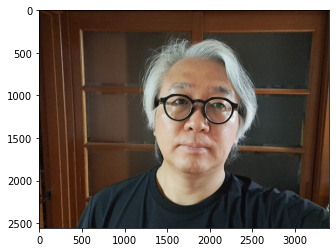

In [ ]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/kjh-1.jpg'
img_orig = cv2.imread(img_path)

print(img_orig.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

### 3개 이미지 한꺼번에 표시하기

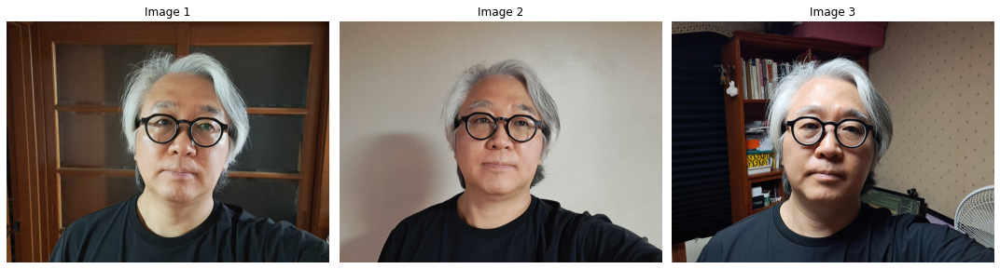

In [ ]:
img_path2 = os.getenv('HOME')+'/aiffel/human_segmentation/images/kjh-2.jpg'
img_path3 = os.getenv('HOME')+'/aiffel/human_segmentation/images/kjh-3.jpg'
img_orig2 = cv2.imread(img_path2)
img_orig3 = cv2.imread(img_path3)

# 1행 3열의 서브플롯 생성
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1행 3열, 크기 설정

# 첫 번째 이미지
axes[0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
axes[0].set_title("Image 1")
axes[0].axis("off")  # 축 숨기기

# 두 번째 이미지
axes[1].imshow(cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB))
axes[1].set_title("Image 2")
axes[1].axis("off")

# 세 번째 이미지
axes[2].imshow(cv2.cvtColor(img_orig3, cv2.COLOR_BGR2RGB))
axes[2].set_title("Image 3")
axes[2].axis("off")

# 이미지들 간에 간격 조절
plt.tight_layout()
plt.show()

## 세그멘테이션에 사용할 사전 학습 모델 로드하기

In [ ]:
# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
# model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
# urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

In [ ]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

## DeepLabV3+ 모델 통해 세그멘테이션 예측하기

In [ ]:
segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용
segvalues2, output2 = model.segmentAsPascalvoc(img_path2)
segvalues3, output3 = model.segmentAsPascalvoc(img_path3)

In [ ]:
# pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

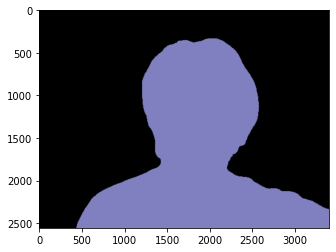

In [ ]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output)
plt.show()

### 원본 이미지와 세그멘테이션 이미지를 함께 표시해 보기

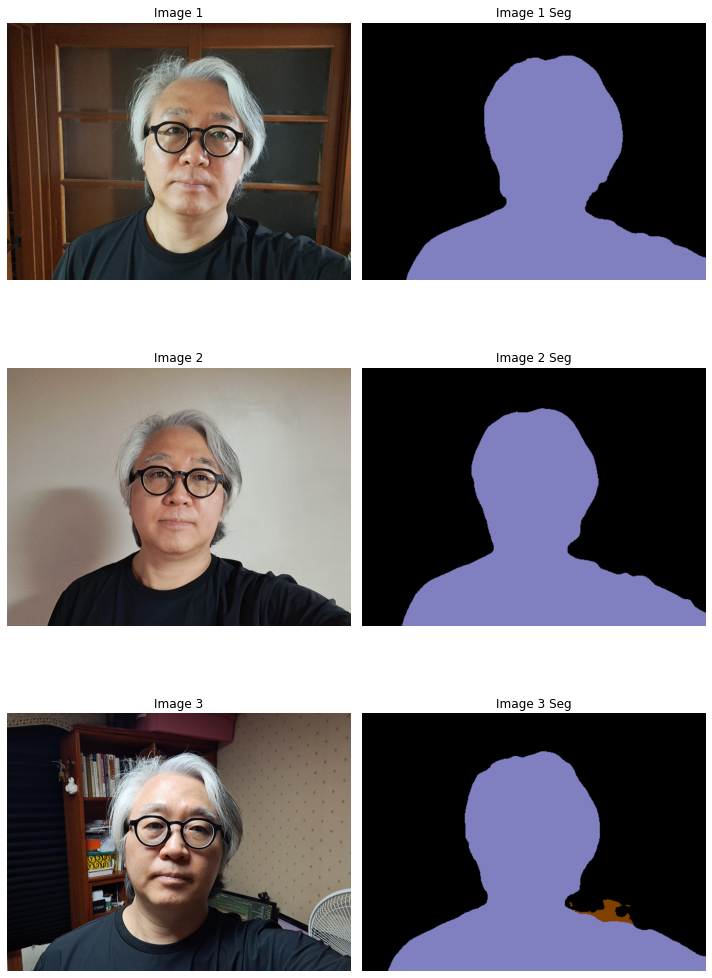

In [ ]:
# 3행 2열의 서브플롯 생성
fig, axes = plt.subplots(3, 2, figsize=(10, 15))  # 1행 3열, 크기 설정

# 이미지 배열
images = [cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB),
          output,
          cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB),
          output2,
          cv2.cvtColor(img_orig3, cv2.COLOR_BGR2RGB),
          output3]
titles = ["Image 1", "Image 1 Seg", "Image 2", "Image 2 Seg", "Image 3", "Image 3 Seg"]

# 각 서브플롯에 이미지와 제목을 설정
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    ax.set_title(titles[i])
    ax.axis("off")  # 축 숨기기

# 이미지들 간에 간격 조절
plt.tight_layout()
plt.show()

### 예측 결과값 확인하기

In [ ]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]])}

In [ ]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [ ]:
segvalues2

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]])}

In [ ]:
for class_id in segvalues2['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [ ]:
segvalues3

{'class_ids': array([ 0, 15, 20]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]])}

In [ ]:
for class_id in segvalues3['class_ids']:
    print(LABEL_NAMES[class_id])

background
person
tv


## 마스크용 이미지 만들기

In [ ]:
# 총 256개의 컬러맵 만들기
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [ ]:
len(colormap)

256

In [ ]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

array([192, 128, 128])

In [ ]:
# RGB 순서로 되어 있는 컬러맵 배열을 OpenCV에서 사용하는 BGR 순서로 변경
seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

In [ ]:
# matplotlib에서 사용하는 컬러맵 종류 출력
print(plt.colormaps())

['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r',

(2556, 3408)


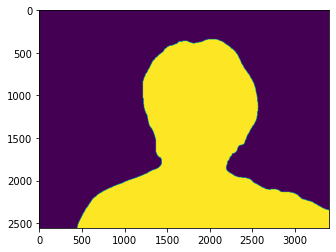

In [ ]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='viridis')
# plt.imshow(seg_map, cmap='gray')
plt.show()

In [ ]:
# seg_map은 0 또는 1로 이루어진 배열
seg_map

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True]])

(2556, 3408)


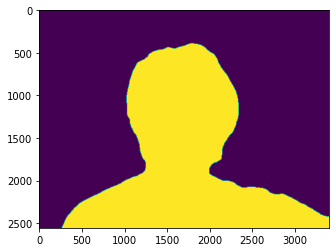

In [ ]:
# [추가] 세번째 이미지로 해보기
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map3 = np.all(output3==seg_color, axis=-1)
print(seg_map3.shape)
plt.imshow(seg_map3, cmap='viridis')
# plt.imshow(seg_map, cmap='gray')
plt.show()

In [ ]:
# [추가] 세번째 이미지로 해보기
# seg_map은 0 또는 1로 이루어진 배열
seg_map3

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True]])

### 마스크 맵을 원래 이미지와 겹쳐서 보기
- img_orig : 원본 이미지
- img_show : 원본 이미지에 컬러 마스크를 겹친 이미지. 원본 이미지에 영향을 주지 않기 위해 별도로 복사해서 사용하고 있음.

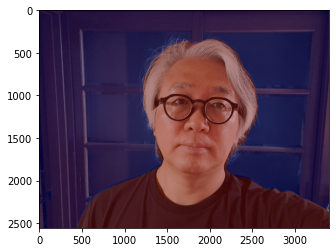

In [ ]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
# [참고] 마지막 5번째 인자는 가중치가 적용된 두 이미지의 합에 추가적으로 더하는 값(스칼라 값)에 해당함. 이미지의 밝기 증가에 영향을 끼침.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

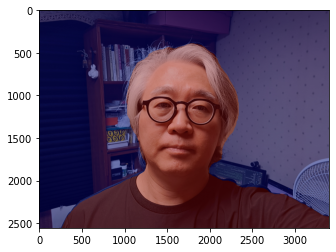

In [ ]:
# [추가] 세번째 이미지로도 해 보기
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show3 = img_orig3.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask3 = seg_map3.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask3 = cv2.applyColorMap(img_mask3, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
# [참고] 마지막 5번째 인자는 가중치가 적용된 두 이미지의 합에 추가적으로 더하는 값(스칼라 값)에 해당함. 이미지의 밝기 증가에 영향을 끼침.
img_show3 = cv2.addWeighted(img_show3, 0.6, color_mask3, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show3, cv2.COLOR_BGR2RGB))
plt.show()

## 원래 이미지를 흐리게 만들기
- 블러 처리한 이미지는 img_orig_blur 변수에 저장

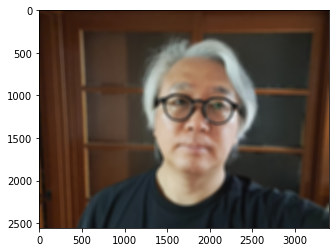

In [ ]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (50, 50))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

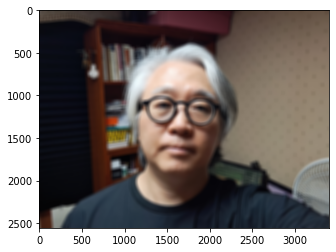

In [ ]:
# [추가] 세번째 이미지로도 해 보기
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur3 = cv2.blur(img_orig3, (50, 50))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_orig_blur3, cv2.COLOR_BGR2RGB))
plt.show()

## 흐려진 이미지에서 세그멘테이션 마스크를 이용해 배경만 추출하기

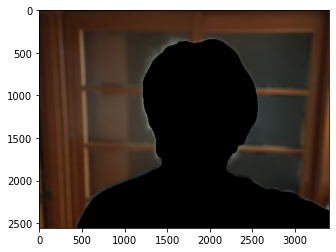

In [ ]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

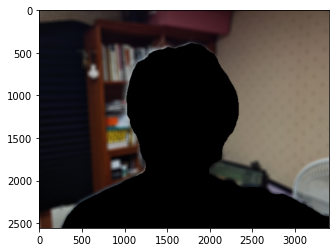

In [ ]:
# [추가] 세번째 이미지로도 해 보기
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
img_mask_color3 = cv2.cvtColor(img_mask3, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask3 = cv2.bitwise_not(img_mask_color3)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur3 = cv2.bitwise_and(img_orig_blur3, img_bg_mask3)
plt.imshow(cv2.cvtColor(img_bg_blur3, cv2.COLOR_BGR2RGB))
plt.show()

## 배경 이미지와 사람 이미지 합치기

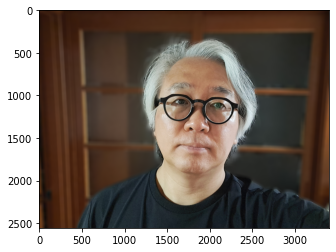

In [ ]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

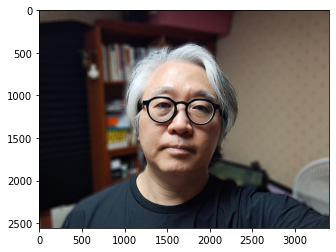

In [ ]:
# [추가] 세번째 이미지로도 해 보기
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat3 = np.where(img_mask_color3==255, img_orig3, img_bg_blur3)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.show()

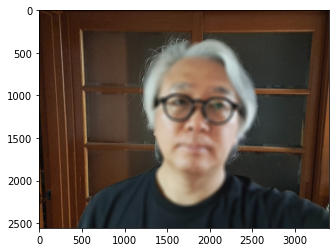

In [ ]:
# Q. 이번에는 사람 부분을 블러로, 배경 부분을 원본으로 출력해볼까요?
# 힌트 : img_mask_color 옵션을 적절히 조정해주고, img_orig, img_orig_blur 를 활용하세요.
img_concat = np.where(img_mask_color==0, img_orig, img_orig_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

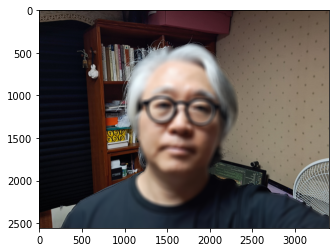

In [ ]:
# [추가] 세번째 이미지로도 해 보기
# Q. 이번에는 사람 부분을 블러로, 배경 부분을 원본으로 출력해볼까요?
# 힌트 : img_mask_color 옵션을 적절히 조정해주고, img_orig, img_orig_blur 를 활용하세요.
img_concat3 = np.where(img_mask_color3==0, img_orig3, img_orig_blur3)
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.show()

## 새로운 배경 이미지로 바꿔치기(크로마키)

(200, 300, 3)


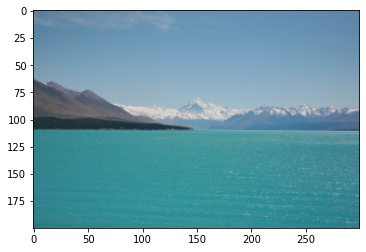

In [ ]:
# 새로운 배경 이미지 불러오기
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/big.jpeg'
new_bg_orig = cv2.imread(img_path)

print(new_bg_orig.shape)

plt.imshow(cv2.cvtColor(new_bg_orig, cv2.COLOR_BGR2RGB))
plt.show()

(2556, 3408, 3)


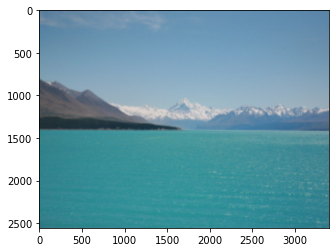

In [ ]:
# 새로운 배경 이미지의 해상도를 기존 이미지 크기에 맞춰 변경하기
resized_new_bg_img = cv2.resize(new_bg_orig, (3408, 2556))  # (width, height) 순서로 크기 지정

print(resized_new_bg_img.shape)

plt.imshow(cv2.cvtColor(resized_new_bg_img, cv2.COLOR_BGR2RGB))
plt.show()

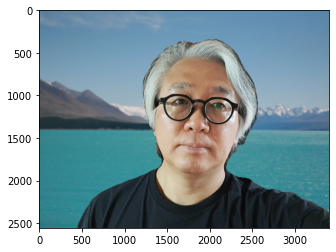

In [ ]:
# 두 이미지 합치기
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 새로운 배경 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, resized_new_bg_img)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

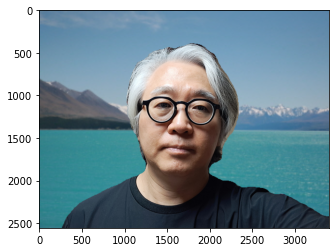

In [ ]:
# [추가] 세번째 이미지로도 해 보기
# 두 이미지 합치기
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 새로운 배경 이미지 값을 사용합니다.
img_concat3 = np.where(img_mask_color3==255, img_orig3, resized_new_bg_img)

plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.show()

## 허깅페이스 모델 활용하기
- CLIP 기반으로 segmentation 작업에 특화된 모델로 개발된 CLIPseg 모델 활용

In [ ]:
from transformers import AutoProcessor, CLIPSegForImageSegmentation

processor = AutoProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

c:\aiffel\exploration\venv\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
from PIL import Image, ImageOps
import requests
import torch
import matplotlib.pyplot as plt

# 이미지 리사이즈 및 패딩 처리
# CLIPSeg 모델이 훈련한 사이즈는 (352, 352) 였음.
def resize_and_pad_image(image, target_size=(352, 352)):
    # 원본 이미지 크기와 비율 계산
    original_width, original_height = image.size
    target_width, target_height = target_size

    # 비율 계산
    aspect_ratio = original_width / original_height
    target_aspect_ratio = target_width / target_height

    # 새 이미지 크기 결정
    if aspect_ratio > target_aspect_ratio:
        # 원본 이미지가 더 넓은 경우
        new_width = target_width
        new_height = int(target_width / aspect_ratio)
    else:
        # 원본 이미지가 더 높은 경우
        new_width = int(target_height * aspect_ratio)
        new_height = target_height

    # 이미지 리사이즈
    # resize 메소드의 두번재 인자는 리사이즈 과정에서 사용할 보간(interpolation) 방법을 지정하는 것임.
    # resize 메소드에서 사용할 수 있는 보간 종류
    # - Image.BILINEAR : 새로운 픽셀 위치를 찾기 위해 2x2 픽셀 블록을 사용하여 주변 픽셀의 값으로부터 선형적으로 값을 보간합니다. 이 방법은 부드러운 이미지 리사이즈를 제공하지만, 때로는 약간의 흐림이 발생할 수 있습니다.
    # - Image.NEAREST : 가장 가까운 픽셀 값을 선택하여 리사이즈합니다. 가장 간단하고 빠르지만, 품질이 낮을 수 있습니다.
    # - Image.BICUBIC : 4x4 픽셀 블록을 사용하여 더 정교한 보간을 제공합니다. 고품질 리사이즈가 가능하지만 계산 비용이 더 큽니다.
    # - Image.LANCZOS : 고급 리사이즈 알고리즘으로, 품질이 매우 높습니다. 주로 축소 작업에 사용됩니다.
    # resized_image = image.resize((new_width, new_height), Image.BILINEAR)
    resized_image = image.resize((new_width, new_height), Image.LANCZOS)

    # 패딩 추가
    delta_width = target_width - new_width
    delta_height = target_height - new_height
    padding = (delta_width // 2, delta_height // 2, delta_width - (delta_width // 2), delta_height - (delta_height // 2))
    padded_image = ImageOps.expand(resized_image, padding, fill=(0, 0, 0))  # 패딩을 추가하며 검은색으로 채움

    return padded_image

# 이미지 로드
image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"  # 이미지 URL을 지정하세요.
# 이미지의 채널 형식이 RGB 형식이 아닌 경우, 강제로 RGB 형식으로 변환(CLIPSeg 모델에서는 RGB 형식만 처리할 수 있기 때문)
image = Image.open(requests.get(image_url, stream=True).raw).convert("RGB")

# 비율 유지하며 리사이즈 및 패딩
resized_padded_image = resize_and_pad_image(image)

# 텍스트와 이미지 전처리
texts = ["a cat", "a remote", "a blanket"]  # 세그멘테이션을 원하는 텍스트 지정
inputs = processor(text=texts, images=[resized_padded_image] * len(texts), padding=True, return_tensors="pt")

# 모델 예측 (세그멘테이션 수행)
# 추론(예측)할 때에는 그래디언트를 저장할 필요가 없기 때문에 torch.no_grad() 옵션으로 실행
with torch.no_grad():
    outputs = model(**inputs)
    logits = outputs.logits

c:\aiffel\exploration\venv\Lib\site-packages\transformers\image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTImageProcessor.preprocess` and were ignored: 'padding'
  return self.preprocess(images, **kwargs)


In [ ]:
# 결과 시각화
# 시각화를 위해 로짓을 시그모이드 함수를 통해 0-1 사이의 값으로 변환
segmentation_maps = torch.sigmoid(logits)

segmentation_maps.shape

torch.Size([3, 352, 352])

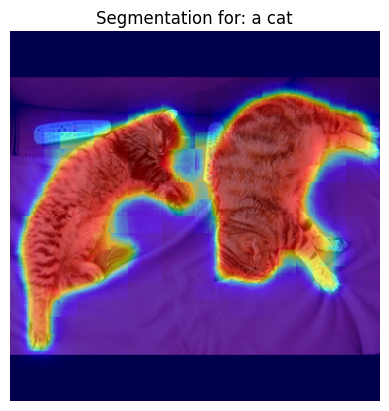

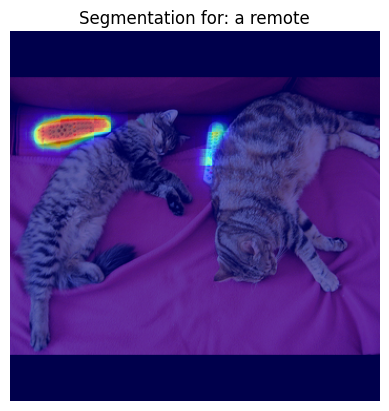

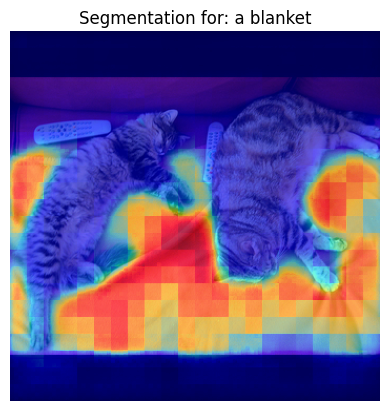

In [ ]:
# 각 텍스트에 대한 세그멘테이션 맵을 시각화
for i, text in enumerate(texts):
    # plt.imshow(image)
    plt.imshow(resized_padded_image)
    # plt.imshow(segmentation_maps[i][0].cpu().numpy(), alpha=0.6, cmap='jet')
    plt.imshow(segmentation_maps[i].cpu().numpy(), alpha=0.6, cmap='jet')
    plt.title(f"Segmentation for: {text}")
    plt.axis('off')
    plt.show()

## Meta의 SAM(Segment Anything Model) 모델 활용하기
- pip install torch torchvision
- pip install git+https://github.com/facebookresearch/segment-anything.git
- pip install opencv-python pycocotools matplotlib onnxruntime onnx
- 다음 주소에서 vit_h 모델 타입을 위한 모델 체크포인트 파일을 다운로드(용량: 2.4GB) : https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

In [ ]:
import torch
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.utils.onnx import SamOnnxModel

import onnxruntime
# from onnxruntime.quantization import QuantType
# from onnxruntime.quantization.quantize import quantize_dynamic

In [ ]:
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [ ]:
checkpoint = "./model/sam/sam_vit_h_4b8939.pth"
model_type = "vit_h"

# 모델 로드
sam = sam_model_registry[model_type](checkpoint=checkpoint)
device = "cpu"
sam.to(device)

c:\aiffel\exploration\venv\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [ ]:
onnx_model_path = None  # Set to use an already exported model, then skip to the next section.

In [ ]:
import warnings

onnx_model_path = "./model/sam/sam_onnx_example.onnx"

onnx_model = SamOnnxModel(sam, return_single_mask=True)

dynamic_axes = {
    "point_coords": {1: "num_points"},
    "point_labels": {1: "num_points"},
}

embed_dim = sam.prompt_encoder.embed_dim
embed_size = sam.prompt_encoder.image_embedding_size
mask_input_size = [4 * x for x in embed_size]
dummy_inputs = {
    "image_embeddings": torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
    "point_coords": torch.randint(low=0, high=1024, size=(1, 5, 2), dtype=torch.float),
    "point_labels": torch.randint(low=0, high=4, size=(1, 5), dtype=torch.float),
    "mask_input": torch.randn(1, 1, *mask_input_size, dtype=torch.float),
    "has_mask_input": torch.tensor([1], dtype=torch.float),
    "orig_im_size": torch.tensor([1500, 2250], dtype=torch.float),
}
output_names = ["masks", "iou_predictions", "low_res_masks"]

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
    warnings.filterwarnings("ignore", category=UserWarning)
    with open(onnx_model_path, "wb") as f:
        torch.onnx.export(
            onnx_model,
            tuple(dummy_inputs.values()),
            f,
            export_params=True,
            verbose=False,
            opset_version=17,
            do_constant_folding=True,
            input_names=list(dummy_inputs.keys()),
            output_names=output_names,
            dynamic_axes=dynamic_axes,
        )

OnnxExporterError: Module onnx is not installed!

# 유진 trial

In [ ]:
import os
import urllib
import numpy as np
from matplotlib import pyplot as plt
import cv2
import pixellib
from pixellib.semantic import semantic_segmentation

Matplotlib is building the font cache; this may take a moment.


In [ ]:
# 이미지 불러오고 출력
img_path1 = os.getenv('HOME')+'/aiffel/lms/node5_semantic_segmentation/1.jpg'
img_path2 = os.getenv('HOME')+'/aiffel/lms/node5_semantic_segmentation/2.jpg'
img_path3 = os.getenv('HOME')+'/aiffel/lms/node5_semantic_segmentation/3.jpg'
img_orig1 = cv2.imread(img_path1)
img_orig2 = cv2.imread(img_path2)
img_orig3 = cv2.imread(img_path3)

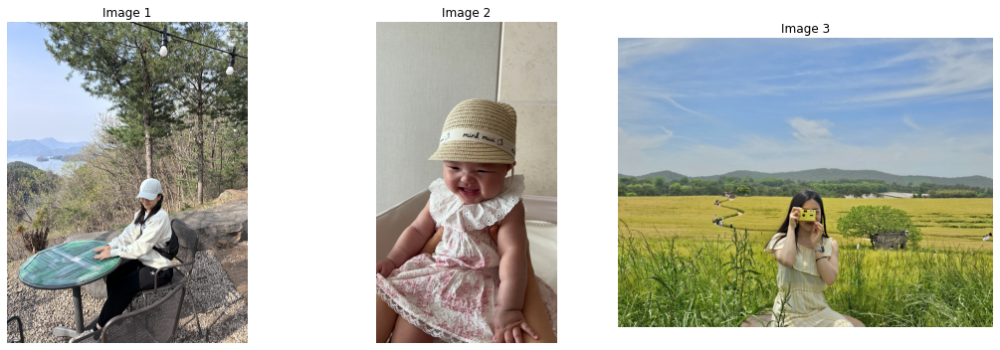

In [ ]:
# 1행 3열의 서브플롯 생성
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1행 3열, 크기 설정

images = [img_orig1, img_orig2, img_orig3]
titles = ["Image 1", "Image 2", "Image 3"]

for i, (img, title) in enumerate(zip(images, titles)):
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(title)
    axes[i].axis("off")  # 축 숨기기

# 이미지들 간에 간격 조절
plt.tight_layout()
plt.show()

In [ ]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

In [ ]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

In [ ]:
# segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용
segvalues1, output1 = model.segmentAsPascalvoc(img_path1)
segvalues2, output2 = model.segmentAsPascalvoc(img_path2)
segvalues3, output3 = model.segmentAsPascalvoc(img_path3)

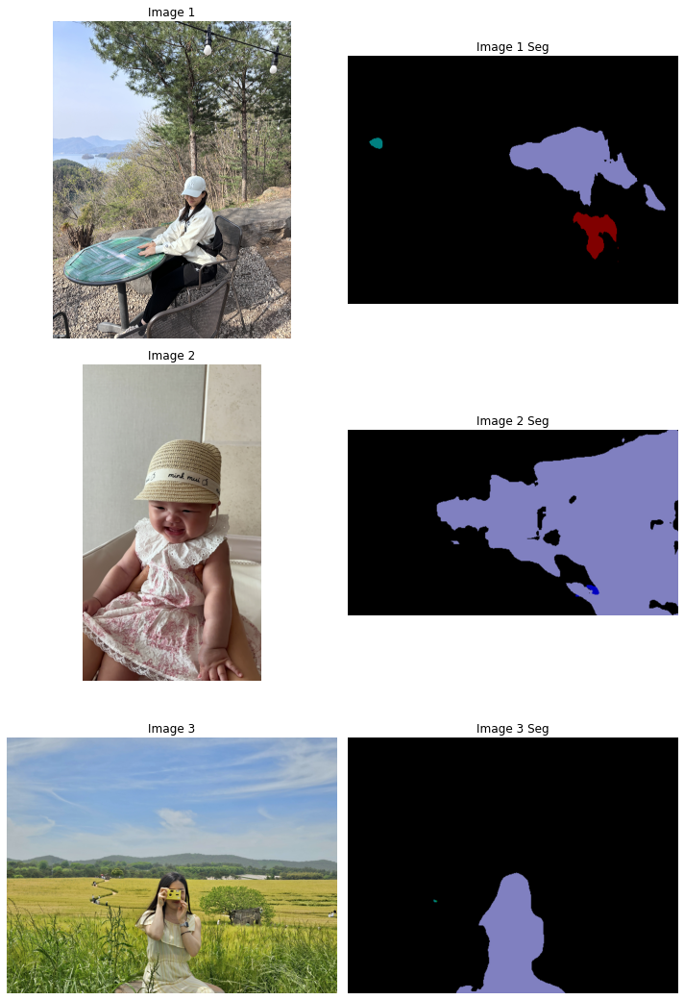

In [ ]:
# 3행 2열의 서브플롯 생성
fig, axes = plt.subplots(3, 2, figsize=(10, 15))  # 2행 3열, 크기 설정

# 이미지 배열
images = [cv2.cvtColor(img_orig1, cv2.COLOR_BGR2RGB),
          output1,
          cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB),
          output2,
          cv2.cvtColor(img_orig3, cv2.COLOR_BGR2RGB),
          output3]
titles = ["Image 1", "Image 1 Seg", "Image 2", "Image 2 Seg", "Image 3", "Image 3 Seg"]

# 각 서브플롯에 이미지와 제목을 설정
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    ax.set_title(titles[i])
    ax.axis("off")  # 축 숨기기

# 이미지들 간에 간격 조절
plt.tight_layout()
plt.show()

1,2번 output이 회전되어서 결과물 출력됨. 다시 회전시키기

In [ ]:
output1 = cv2.rotate(output1, cv2.ROTATE_90_CLOCKWISE)
output2 = cv2.rotate(output2, cv2.ROTATE_90_CLOCKWISE)

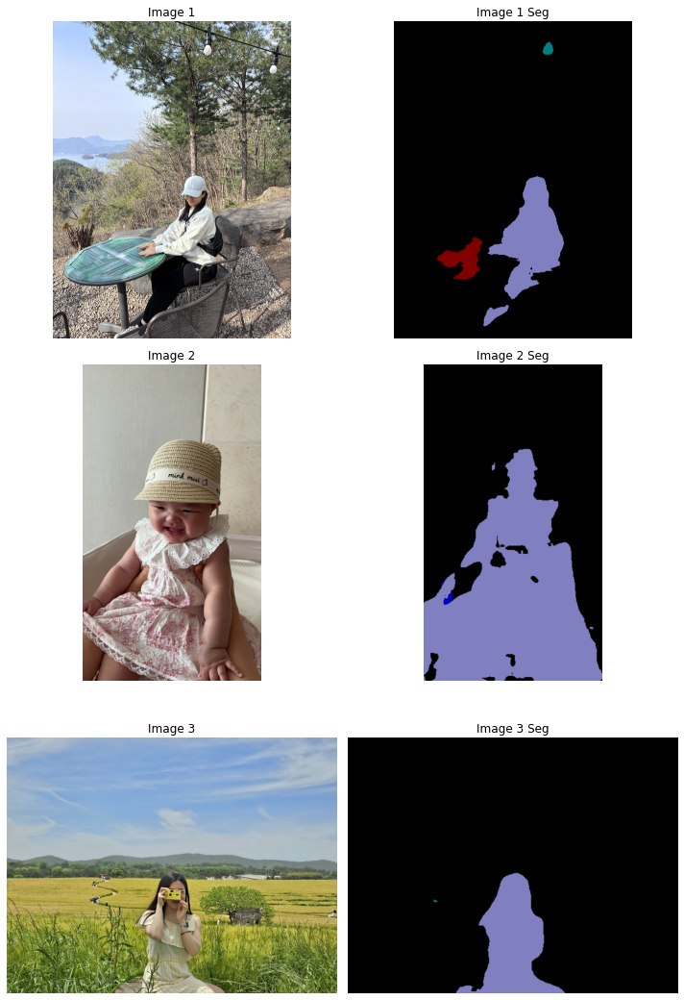

In [ ]:
# 3행 2열의 서브플롯 생성
fig, axes = plt.subplots(3, 2, figsize=(10, 15))  # 2행 3열, 크기 설정

# 이미지 배열
images = [cv2.cvtColor(img_orig1, cv2.COLOR_BGR2RGB),
          output1,
          cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB),
          output2,
          cv2.cvtColor(img_orig3, cv2.COLOR_BGR2RGB),
          output3]
titles = ["Image 1", "Image 1 Seg", "Image 2", "Image 2 Seg", "Image 3", "Image 3 Seg"]

# 각 서브플롯에 이미지와 제목을 설정
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    ax.set_title(titles[i])
    ax.axis("off")  # 축 숨기기

# 이미지들 간에 간격 조절
plt.tight_layout()
plt.show()

In [ ]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

In [ ]:
for class_id in segvalues1['class_ids']:
    print(f'1st image: {LABEL_NAMES[class_id]}')
print('--------------------------------')
for class_id in segvalues2['class_ids']:
    print(f'2nd image: {LABEL_NAMES[class_id]}')
print('--------------------------------')
for class_id in segvalues3['class_ids']:
    print(f'3rd image: {LABEL_NAMES[class_id]}')

1st image: background
1st image: bird
1st image: boat
1st image: person
--------------------------------
2nd image: background
2nd image: chair
2nd image: person
--------------------------------
3rd image: background
3rd image: bicycle
3rd image: bird
3rd image: person


In [ ]:
#컬러맵 만들기
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [ ]:
# 사람 label의 컬러맵 번호 확인하기
colormap[15]

array([192, 128, 128])

In [ ]:
# matplotlib에서 사용하는 컬러맵 종류 출력
print(plt.colormaps())

['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r',

In [ ]:
# 사람 label의 컬러맵 번호
seg_color = (128,128,192)

In [ ]:
seg_map1 = np.all(output1==seg_color, axis=-1)
seg_map2 = np.all(output2==seg_color, axis=-1)
seg_map3 = np.all(output3==seg_color, axis=-1)

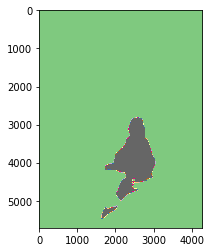

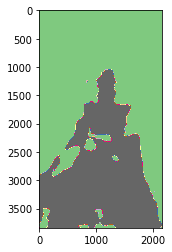

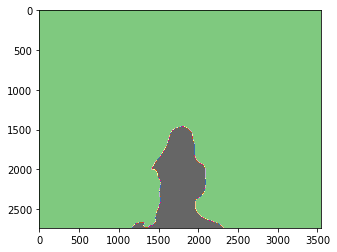

In [ ]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 Accent로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함

plt.imshow(seg_map1, cmap='Accent')
plt.show()
plt.imshow(seg_map2, cmap='Accent')
plt.show()
plt.imshow(seg_map3, cmap='Accent')
plt.show()

## 흐린배경과 원본영상 합성

### 첫번째 이미지

In [ ]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show1 = img_orig1.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask1 = seg_map1.astype(np.uint8) * 255

In [ ]:
print(img_show1.shape)

(5712, 4284, 3)


In [ ]:
# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask1 = cv2.applyColorMap(img_mask1, cv2.COLORMAP_JET)
# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
# [참고] 마지막 5번째 인자는 가중치가 적용된 두 이미지의 합에 추가적으로 더하는 값(스칼라 값)에 해당함. 이미지의 밝기 증가에 영향을 끼침.
img_show1 = cv2.addWeighted(img_show1, 0.6, color_mask1, 0.4, 0.0)

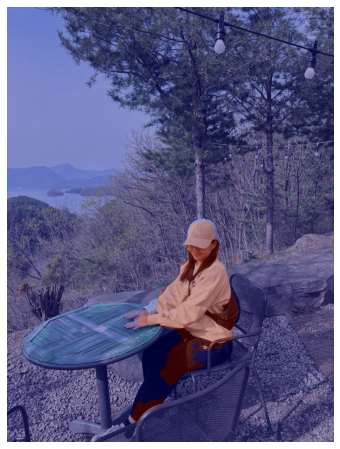

In [ ]:
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_show1, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# blurring kernel size를 (100,100)으로 확실하게 블러링 처리
img_orig_blur1 = cv2.blur(img_orig1, (100,100))

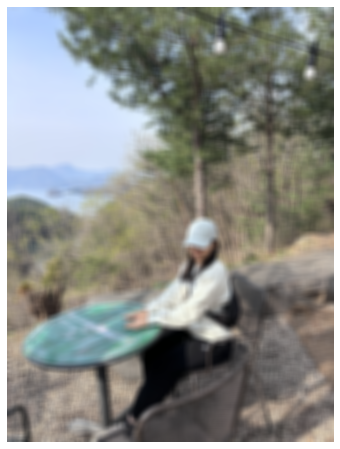

In [ ]:
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_orig_blur1, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
img_mask_color1 = cv2.cvtColor(img_mask1, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask1 = cv2.bitwise_not(img_mask_color1)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur1 = cv2.bitwise_and(img_orig_blur1, img_bg_mask1)

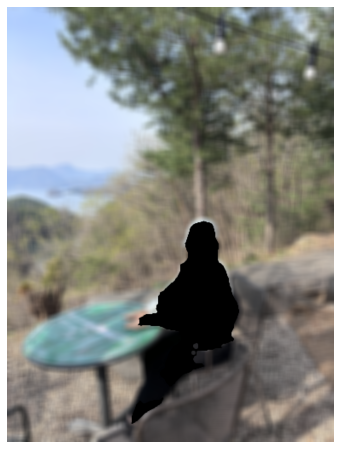

In [ ]:
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_bg_blur1, cv2.COLOR_BGR2RGB))
plt.show()

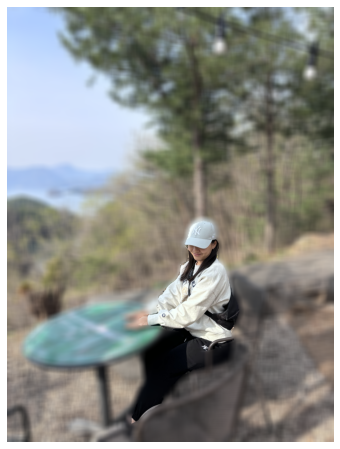

In [ ]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color1==255, img_orig1, img_bg_blur1)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### 두번째 이미지

In [ ]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show2 = img_orig2.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask2 = seg_map2.astype(np.uint8) * 255

In [ ]:
print(img_show2.shape)

(3840, 2160, 3)


In [ ]:
# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask2, cv2.COLORMAP_JET)
# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
# [참고] 마지막 5번째 인자는 가중치가 적용된 두 이미지의 합에 추가적으로 더하는 값(스칼라 값)에 해당함. 이미지의 밝기 증가에 영향을 끼침.
img_show2 = cv2.addWeighted(img_show2, 0.6, color_mask, 0.4, 0.0)

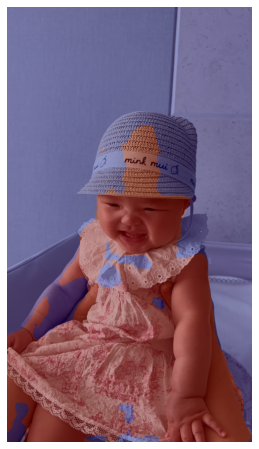

In [ ]:
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_show2, cv2.COLOR_BGR2RGB))
plt.show()

2번째 이미지는 segmentation 성능이 많이 떨어지는 모습. 객체가 멀리있지도 않고, 주변에 헷갈릴만한 다른 객체가 있는것도 아닌데..?   
모자도 쓰고있고, 프릴도 달려있는게 헷갈리는 모양이다

In [ ]:
img_orig_blur2 = cv2.blur(img_orig2, (100,100))

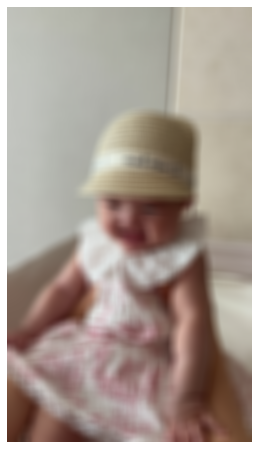

In [ ]:
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_orig_blur2, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
img_mask_color2 = cv2.cvtColor(img_mask2, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask2 = cv2.bitwise_not(img_mask_color2)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur2 = cv2.bitwise_and(img_orig_blur2, img_bg_mask2)

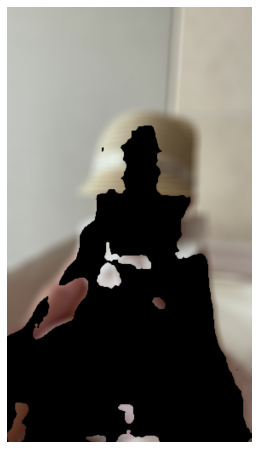

In [ ]:
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_bg_blur2, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color2==255, img_orig2, img_bg_blur2)

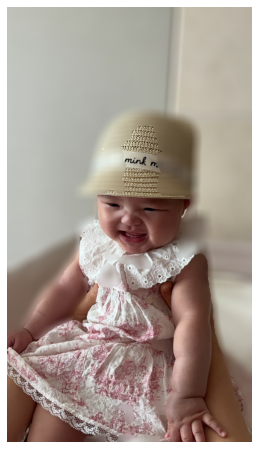

In [ ]:
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### 세번째 이미지

In [ ]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show3 = img_orig3.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask3 = seg_map3.astype(np.uint8) * 255

In [ ]:
# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask3, cv2.COLORMAP_JET)
# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
# [참고] 마지막 5번째 인자는 가중치가 적용된 두 이미지의 합에 추가적으로 더하는 값(스칼라 값)에 해당함. 이미지의 밝기 증가에 영향을 끼침.
img_show3 = cv2.addWeighted(img_show3, 0.6, color_mask, 0.4, 0.0)

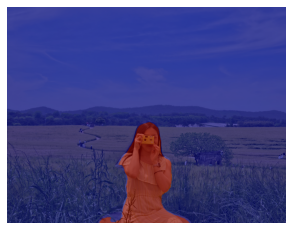

In [ ]:
plt.figure(figsize=(5,4))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_show3, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
img_orig_blur3 = cv2.blur(img_orig3, (100,100))

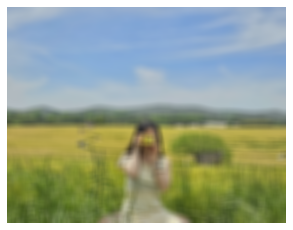

In [ ]:
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(5,4))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_orig_blur3, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
img_mask_color3 = cv2.cvtColor(img_mask3, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask3 = cv2.bitwise_not(img_mask_color3)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!

img_bg_blur3 = cv2.bitwise_and(img_orig_blur3, img_bg_mask3)

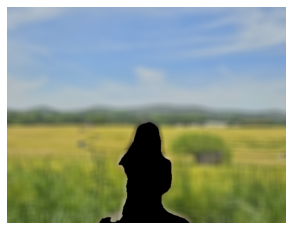

In [ ]:
plt.figure(figsize=(5,4))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_bg_blur3, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color3==255, img_orig3, img_bg_blur3)

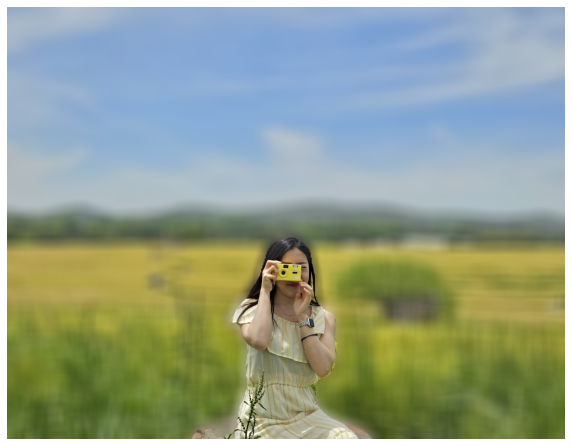

In [ ]:
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## Trial 1 : 고양이 아웃포커싱해보기

In [ ]:
img_path4 = os.getenv('HOME')+'/aiffel/lms/node5_semantic_segmentation/cat.jpg'
img_orig4 = cv2.imread(img_path4)

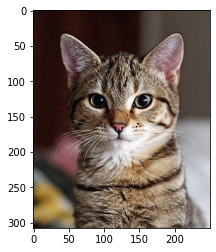

In [ ]:
plt.imshow(cv2.cvtColor(img_orig4, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
segvalues4, output4 = model.segmentAsPascalvoc(img_path4)

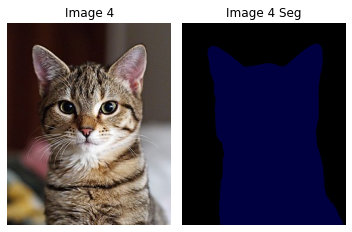

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(5,8))
images = [cv2.cvtColor(img_orig4, cv2.COLOR_BGR2RGB),
          output4]
titles = ["Image 4", "Image 4 Seg"]
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    ax.set_title(titles[i])
    ax.axis("off")  # 축 숨기기
plt.tight_layout()
plt.show()

In [ ]:
for class_id in segvalues4['class_ids']:
    print(f' {class_id}: {LABEL_NAMES[class_id]}')

 0: background
 8: cat


In [ ]:
colormap[8]

array([64,  0,  0])

In [ ]:
cat_seg_color = (0,0,64)

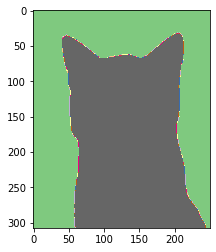

In [ ]:
seg_map4 = np.all(output4==cat_seg_color, axis=-1)
plt.imshow(seg_map4, cmap='Accent')
plt.show()

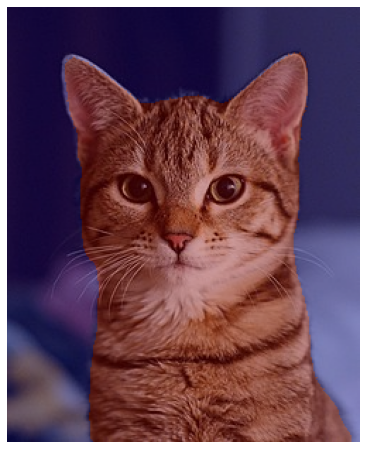

In [ ]:
img_show4 = img_orig4.copy()
img_mask4 = seg_map4.astype(np.uint8) * 255
color_mask4 = cv2.applyColorMap(img_mask4, cv2.COLORMAP_JET)
img_show4 = cv2.addWeighted(img_show4, 0.6, color_mask4, 0.4, 0.0)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_show4, cv2.COLOR_BGR2RGB))
plt.show()

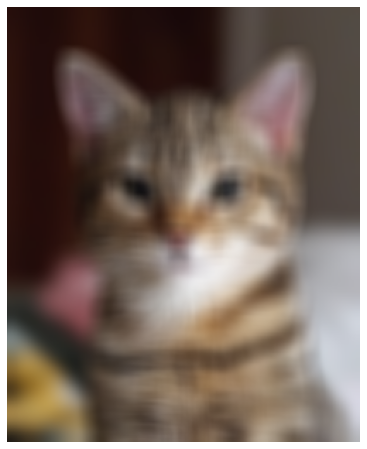

In [ ]:
img_orig_blur4 = cv2.blur(img_orig4, (15,15))
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_orig_blur4, cv2.COLOR_BGR2RGB))
plt.show()

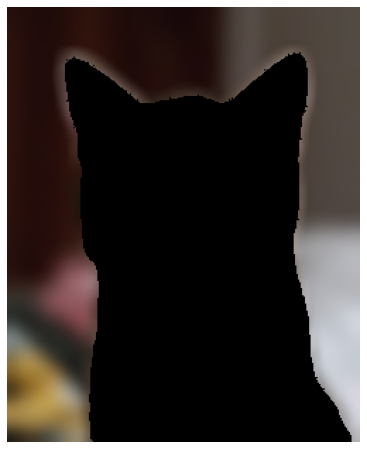

In [ ]:
img_mask_color4 = cv2.cvtColor(img_mask4, cv2.COLOR_GRAY2BGR)
img_bg_mask4 = cv2.bitwise_not(img_mask_color4)
img_bg_blur4 = cv2.bitwise_and(img_orig_blur4, img_bg_mask4)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_bg_blur4, cv2.COLOR_BGR2RGB))
plt.show()

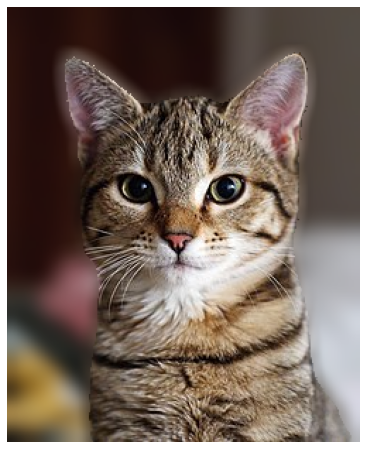

In [ ]:
img_concat4 = np.where(img_mask_color4==255, img_orig4, img_bg_blur4)
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_concat4, cv2.COLOR_BGR2RGB))
plt.show()

## Trial 2 : 다른 배경 합성하기

In [ ]:
# 합성할 이미지 불러오기
back_path = os.getenv('HOME')+'/aiffel/lms/node5_semantic_segmentation/aurora.jpeg'
back_img = cv2.imread(back_path)

In [ ]:
resized_back_img1 = cv2.resize(back_img, (4284, 5712))
img_concat1 = np.where(img_mask_color1==255, img_orig1, resized_back_img1)

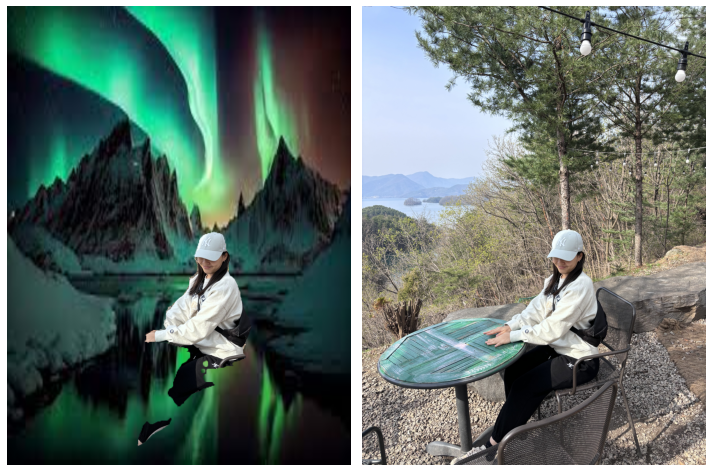

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,8))
images = [cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB),
          cv2.cvtColor(img_orig1, cv2.COLOR_BGR2RGB)]
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    ax.axis("off")  # 축 숨기기
plt.tight_layout()
plt.show()

**이미지에서 까만 바지를 입었는데, 인식해내지 못함.  
손 끝도 인식하지 못한 모습**

In [ ]:
resized_back_img2 = cv2.resize(back_img, (2160, 3840))
img_concat2 = np.where(img_mask_color2==255, img_orig2, resized_back_img2)

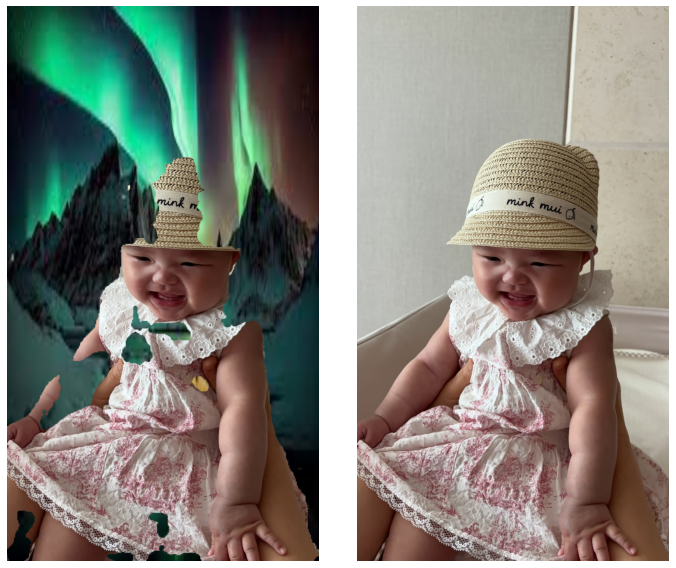

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,8))
images = [cv2.cvtColor(img_concat2, cv2.COLOR_BGR2RGB),
          cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB)]
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    ax.axis("off")  # 축 숨기기
plt.tight_layout()
plt.show()

**모자, 목의 프릴, 오른쪽 팔을 잘 인식하지 못한 모습.  
잡고있는 다른사람의 팔은 같은 객체로 인식하여 출력한 모습보임.**

In [ ]:
resized_back_img3 = cv2.resize(back_img, (3539, 2738))
img_concat3 = np.where(img_mask_color3==255, img_orig3, resized_back_img3)

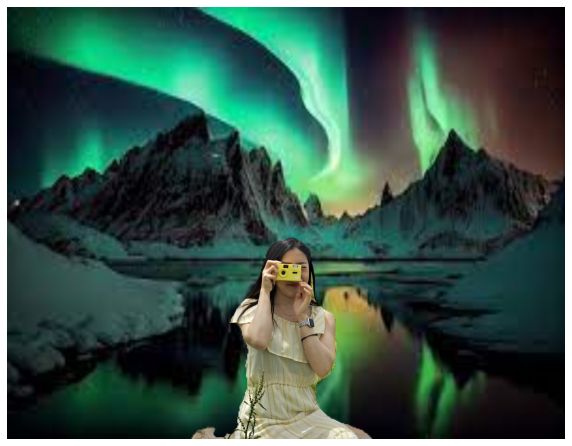

In [ ]:
plt.figure(figsize=(10, 8))
plt.axis('off')  # 축 숨기기
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.show()

## Object masks from prompts with SAM

### Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [ ]:
using_colab = False

In [ ]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

Necessary imports and helper functions for displaying points, boxes, and masks.

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


### Example image

In [ ]:
image = cv2.imread('images/truck.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

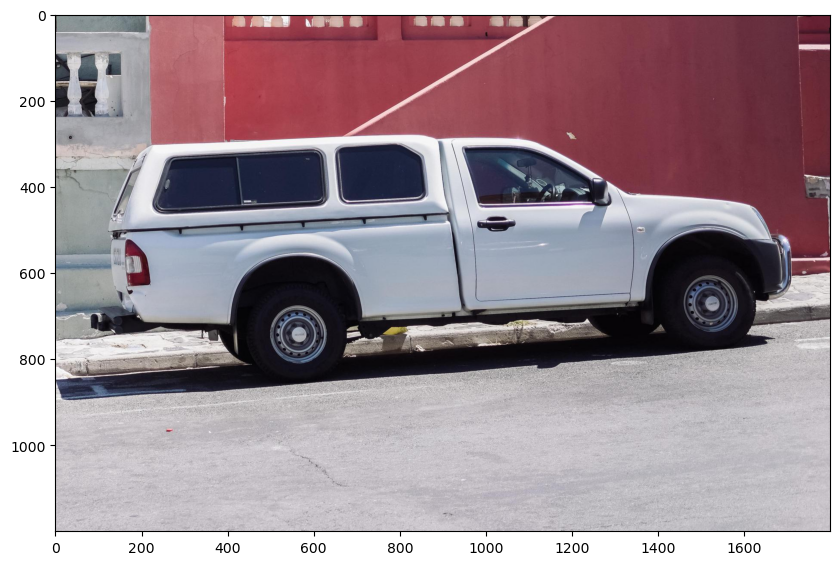

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

### Selecting objects with SAM

First, load the SAM model and predictor. Change the path below to point to the SAM checkpoint. Running on CUDA and using the default model are recommended for best results.

In [ ]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

Process the image to produce an image embedding by calling `SamPredictor.set_image`. `SamPredictor` remembers this embedding and will use it for subsequent mask prediction.

In [ ]:
predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [ ]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

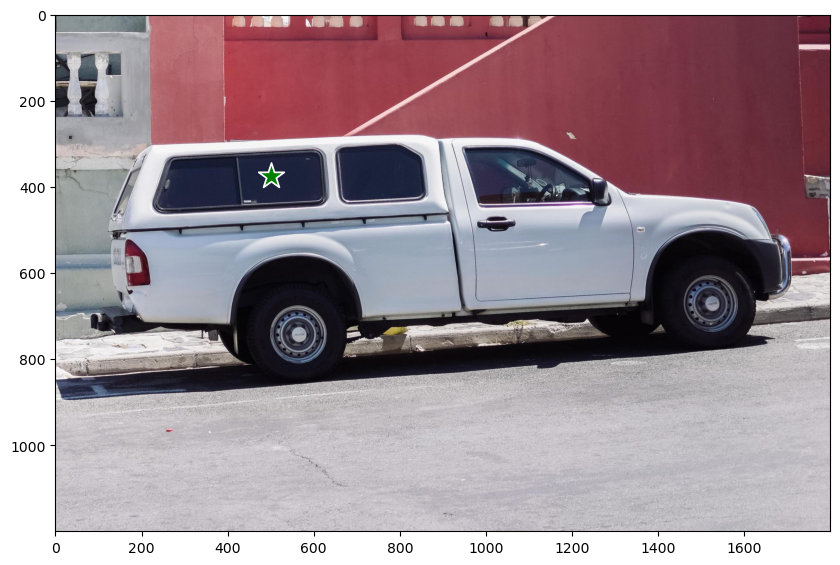

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

Predict with `SamPredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [ ]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

With `multimask_output=True` (the default setting), SAM outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [ ]:
masks.shape  # (number_of_masks) x H x W

(3, 1200, 1800)

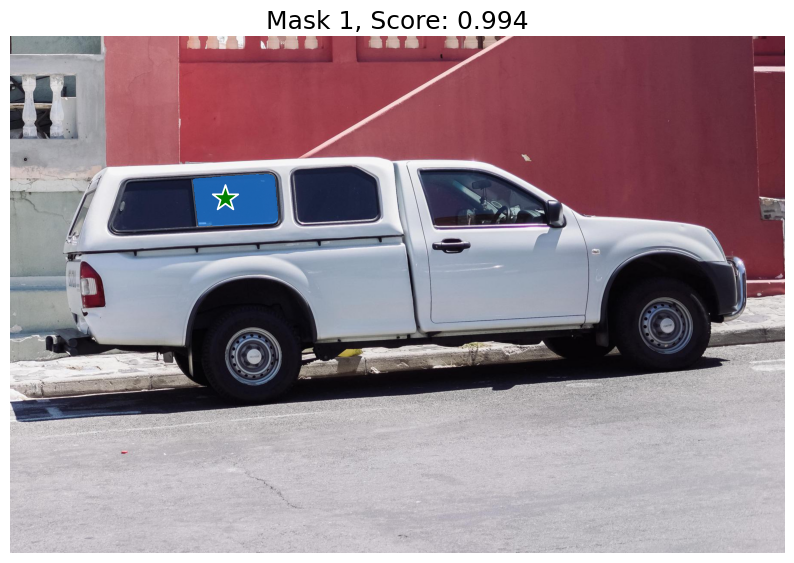

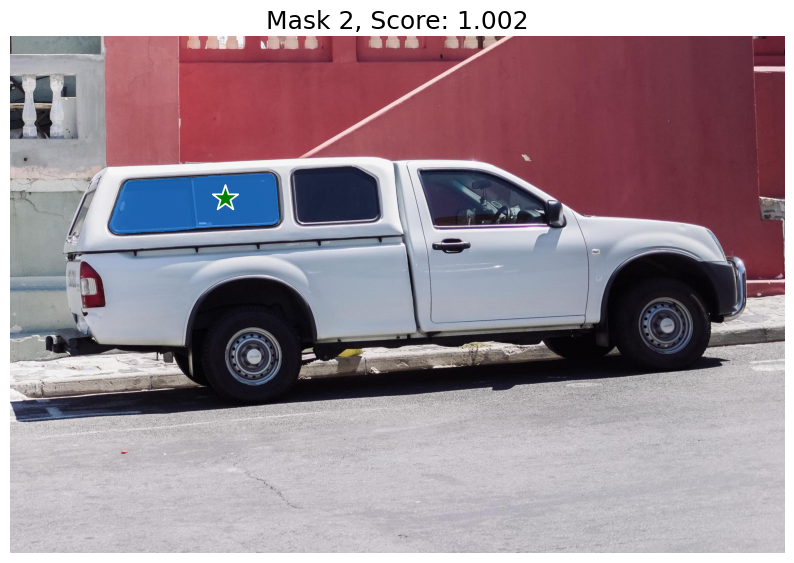

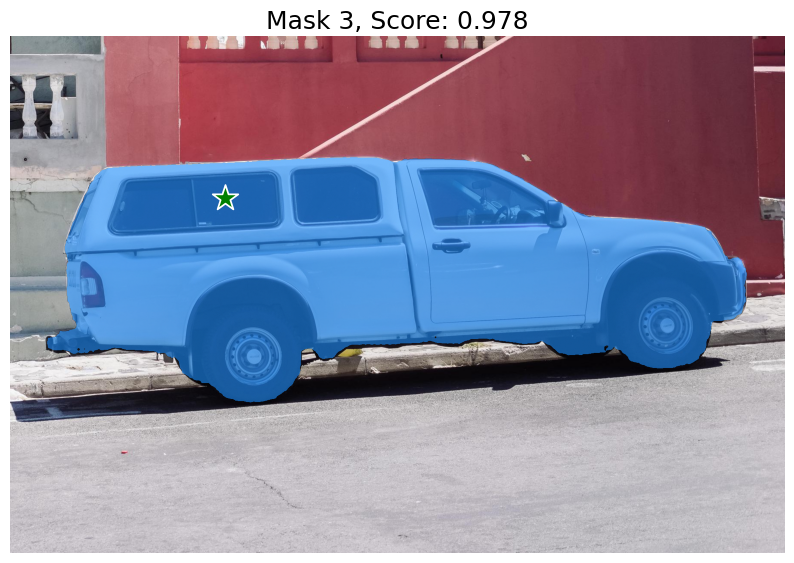

In [ ]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()


### Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [ ]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [ ]:
masks.shape

(1, 1200, 1800)

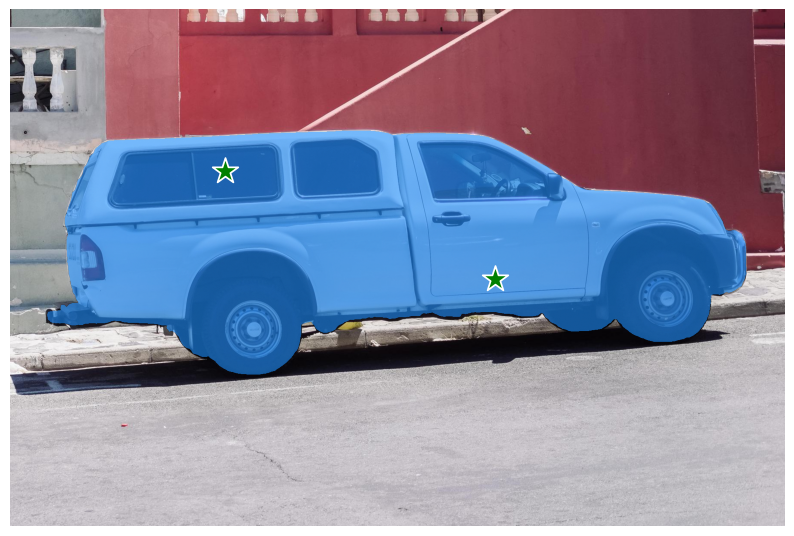

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [ ]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

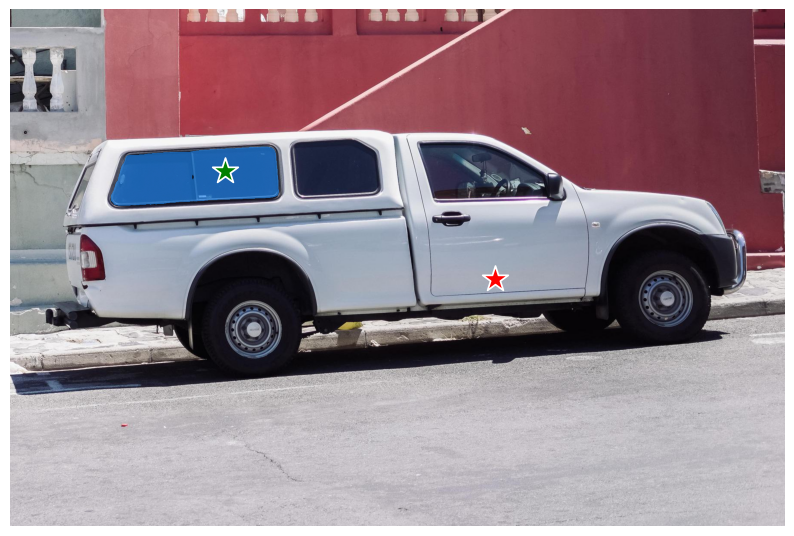

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

### Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [ ]:
input_box = np.array([425, 600, 700, 875])

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

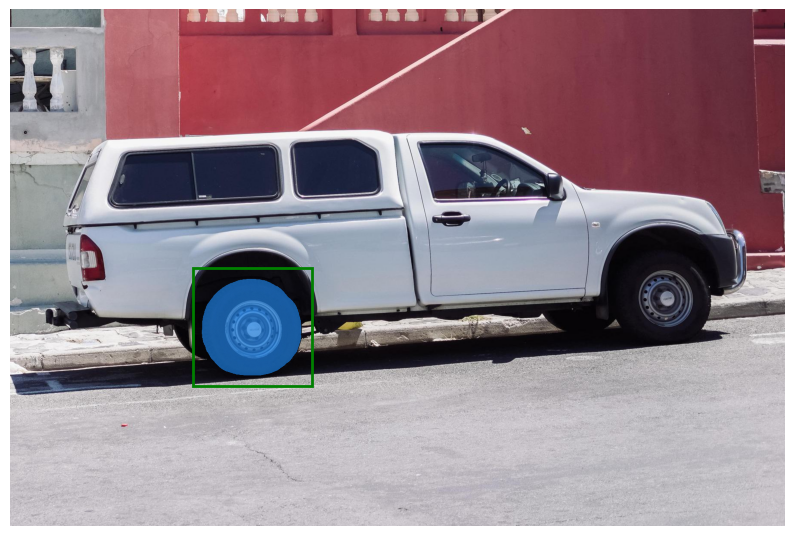

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

### Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [ ]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

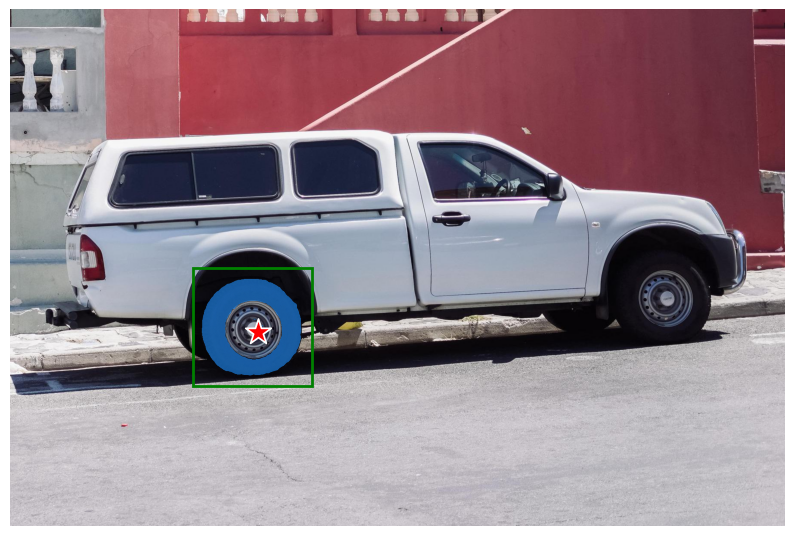

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

### Batched prompt inputs

SamPredictor can take multiple input prompts for the same image, using `predict_torch` method. This method assumes input points are already torch tensors and have already been transformed to the input frame. For example, imagine we have several box outputs from an object detector.

In [ ]:
input_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=predictor.device)

Transform the boxes to the input frame, then predict masks. `SamPredictor` stores the necessary transform as the `transform` field for easy access, though it can also be instantiated directly for use in e.g. a dataloader (see `segment_anything.utils.transforms`).

In [ ]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [ ]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([4, 1, 1200, 1800])

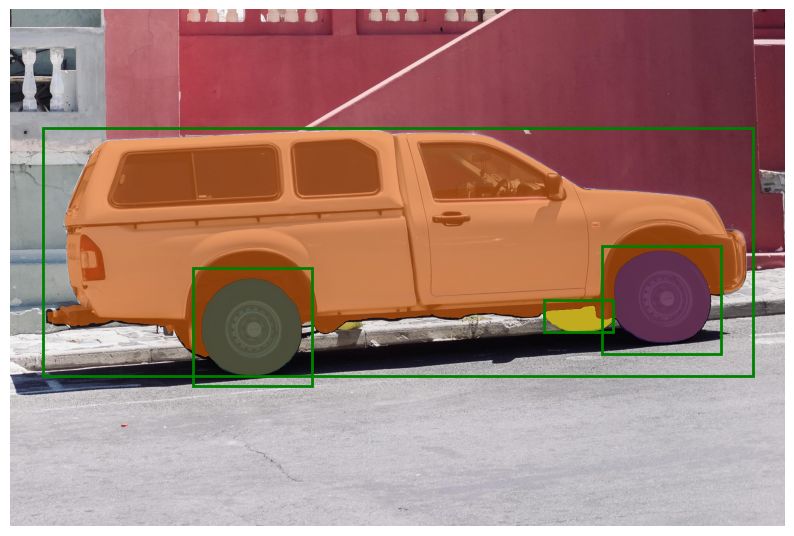

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

### End-to-end batched inference

If all prompts are available in advance, it is possible to run SAM directly in an end-to-end fashion. This also allows batching over images.

In [ ]:
image1 = image  # truck.jpg from above
image1_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=sam.device)

image2 = cv2.imread('images/groceries.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_boxes = torch.tensor([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
], device=sam.device)

Both images and prompts are input as PyTorch tensors that are already transformed to the correct frame. Inputs are packaged as a list over images, which each element is a dict that takes the following keys:
* `image`: The input image as a PyTorch tensor in CHW format.
* `original_size`: The size of the image before transforming for input to SAM, in (H, W) format.
* `point_coords`: Batched coordinates of point prompts.
* `point_labels`: Batched labels of point prompts.
* `boxes`: Batched input boxes.
* `mask_inputs`: Batched input masks.

If a prompt is not present, the key can be excluded.

In [ ]:
from segment_anything.utils.transforms import ResizeLongestSide
resize_transform = ResizeLongestSide(sam.image_encoder.img_size)

def prepare_image(image, transform, device):
    image = transform.apply_image(image)
    image = torch.as_tensor(image, device=device.device)
    return image.permute(2, 0, 1).contiguous()

In [ ]:
batched_input = [
     {
         'image': prepare_image(image1, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image1_boxes, image1.shape[:2]),
         'original_size': image1.shape[:2]
     },
     {
         'image': prepare_image(image2, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image2_boxes, image2.shape[:2]),
         'original_size': image2.shape[:2]
     }
]

Run the model.

In [ ]:
batched_output = sam(batched_input, multimask_output=False)

The output is a list over results for each input image, where list elements are dictionaries with the following keys:
* `masks`: A batched torch tensor of predicted binary masks, the size of the original image.
* `iou_predictions`: The model's prediction of the quality for each mask.
* `low_res_logits`: Low res logits for each mask, which can be passed back to the model as mask input on a later iteration.

In [ ]:
batched_output[0].keys()

dict_keys(['masks', 'iou_predictions', 'low_res_logits'])

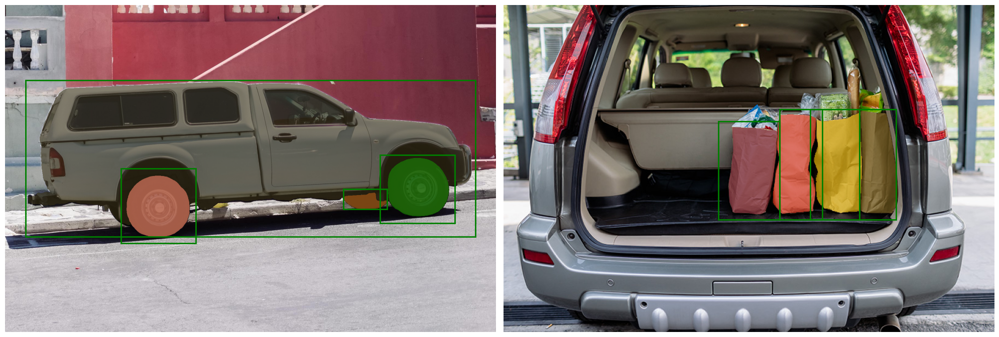

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

ax[0].imshow(image1)
for mask in batched_output[0]['masks']:
    show_mask(mask.cpu().numpy(), ax[0], random_color=True)
for box in image1_boxes:
    show_box(box.cpu().numpy(), ax[0])
ax[0].axis('off')

ax[1].imshow(image2)
for mask in batched_output[1]['masks']:
    show_mask(mask.cpu().numpy(), ax[1], random_color=True)
for box in image2_boxes:
    show_box(box.cpu().numpy(), ax[1])
ax[1].axis('off')

plt.tight_layout()
plt.show()